**Long Short-Term Memory (LSTM)** networks are a type of recurrent neural network (RNN) that has proven to be effective in capturing long-term dependencies in sequences, making them well-suited for time series forecasting. LSTMs are designed to handle the vanishing gradient problem that traditional RNNs often face, enabling them to capture information over extended time lags.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pylab as plt
import matplotlib.dates as mdates
plt.rcParams['figure.figsize'] = (15.0, 8.0)
import pandas as pd
import seaborn as sns

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar

In [2]:
import bokeh as bk
#from bokeh.charts import output_file, show ,TimeSeries 
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [3]:
data = pd.read_excel(r"C:\Users\Darshan\Downloads\D202.xlsx" )
data

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES
0,Electric usage,2016-10-22,00:00:00,00:14:00,0.01,kWh,0.00,NaN
1,Electric usage,2016-10-22,00:15:00,00:29:00,0.01,kWh,0.00,NaN
2,Electric usage,2016-10-22,00:30:00,00:44:00,0.01,kWh,0.00,NaN
3,Electric usage,2016-10-22,00:45:00,00:59:00,0.01,kWh,0.00,NaN
4,Electric usage,2016-10-22,01:00:00,01:14:00,0.01,kWh,0.00,NaN
...,...,...,...,...,...,...,...,...
70363,Electric usage,2018-10-24,22:45:00,22:59:00,0.02,kWh,0.00,NaN
70364,Electric usage,2018-10-24,23:00:00,23:14:00,0.03,kWh,0.01,NaN
70365,Electric usage,2018-10-24,23:15:00,23:29:00,0.03,kWh,0.01,NaN
70366,Electric usage,2018-10-24,23:30:00,23:44:00,0.03,kWh,0.01,NaN


In [4]:
data["Date"] = pd.to_datetime(data["Date"])
data["DateTime"] = data["Date"] + pd.to_timedelta(data["END TIME"].astype(str))
data

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime
0,Electric usage,2016-10-22,00:00:00,00:14:00,0.01,kWh,0.00,NaN,2016-10-22 00:14:00
1,Electric usage,2016-10-22,00:15:00,00:29:00,0.01,kWh,0.00,NaN,2016-10-22 00:29:00
2,Electric usage,2016-10-22,00:30:00,00:44:00,0.01,kWh,0.00,NaN,2016-10-22 00:44:00
3,Electric usage,2016-10-22,00:45:00,00:59:00,0.01,kWh,0.00,NaN,2016-10-22 00:59:00
4,Electric usage,2016-10-22,01:00:00,01:14:00,0.01,kWh,0.00,NaN,2016-10-22 01:14:00
...,...,...,...,...,...,...,...,...,...
70363,Electric usage,2018-10-24,22:45:00,22:59:00,0.02,kWh,0.00,NaN,2018-10-24 22:59:00
70364,Electric usage,2018-10-24,23:00:00,23:14:00,0.03,kWh,0.01,NaN,2018-10-24 23:14:00
70365,Electric usage,2018-10-24,23:15:00,23:29:00,0.03,kWh,0.01,NaN,2018-10-24 23:29:00
70366,Electric usage,2018-10-24,23:30:00,23:44:00,0.03,kWh,0.01,NaN,2018-10-24 23:44:00


In [5]:
data["DAY_TYPE"] = data.DateTime.apply(lambda x: 1 if x.dayofweek > 5 else 0  )
data["DAY_TYPE"].unique()

array([0, 1], dtype=int64)

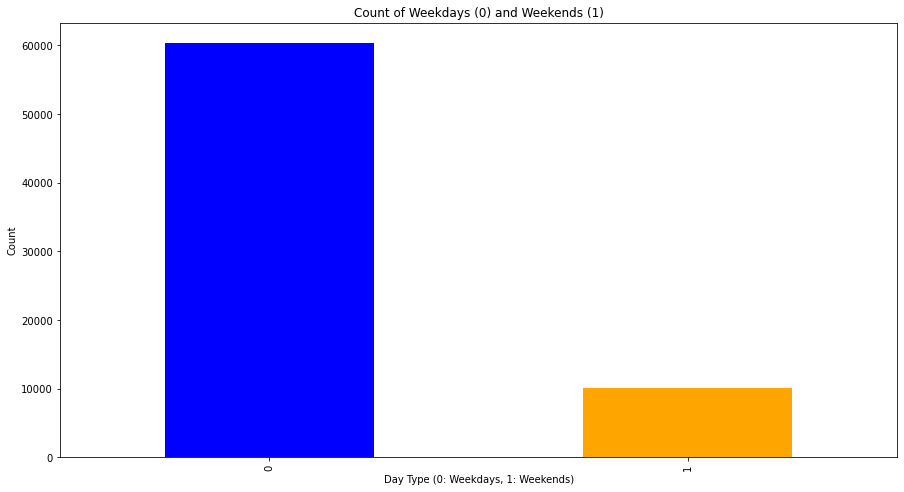

In [6]:
# Count the occurrences of 0s and 1s
day_type_counts = data["DAY_TYPE"].value_counts()

# Plot the bar graph
day_type_counts.plot(kind='bar', color=['blue', 'orange'])
plt.xlabel('Day Type (0: Weekdays, 1: Weekends)')
plt.ylabel('Count')
plt.title('Count of Weekdays (0) and Weekends (1)')
plt.show()

In [7]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
cal = calendar()
holidays = cal.holidays(start = data.DateTime.min(), end = data.DateTime.max())
data["IS_HOLIDAY"] = data.DateTime.isin(holidays)

In [8]:
data

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY
0,Electric usage,2016-10-22,00:00:00,00:14:00,0.01,kWh,0.00,NaN,2016-10-22 00:14:00,0,False
1,Electric usage,2016-10-22,00:15:00,00:29:00,0.01,kWh,0.00,NaN,2016-10-22 00:29:00,0,False
2,Electric usage,2016-10-22,00:30:00,00:44:00,0.01,kWh,0.00,NaN,2016-10-22 00:44:00,0,False
3,Electric usage,2016-10-22,00:45:00,00:59:00,0.01,kWh,0.00,NaN,2016-10-22 00:59:00,0,False
4,Electric usage,2016-10-22,01:00:00,01:14:00,0.01,kWh,0.00,NaN,2016-10-22 01:14:00,0,False
...,...,...,...,...,...,...,...,...,...,...,...
70363,Electric usage,2018-10-24,22:45:00,22:59:00,0.02,kWh,0.00,NaN,2018-10-24 22:59:00,0,False
70364,Electric usage,2018-10-24,23:00:00,23:14:00,0.03,kWh,0.01,NaN,2018-10-24 23:14:00,0,False
70365,Electric usage,2018-10-24,23:15:00,23:29:00,0.03,kWh,0.01,NaN,2018-10-24 23:29:00,0,False
70366,Electric usage,2018-10-24,23:30:00,23:44:00,0.03,kWh,0.01,NaN,2018-10-24 23:44:00,0,False


In [9]:
# Count the occurrences of True and False in the "IS_HOLIDAY" column
holiday_counts = data["IS_HOLIDAY"].value_counts()
holiday_counts

False    70368
Name: IS_HOLIDAY, dtype: int64

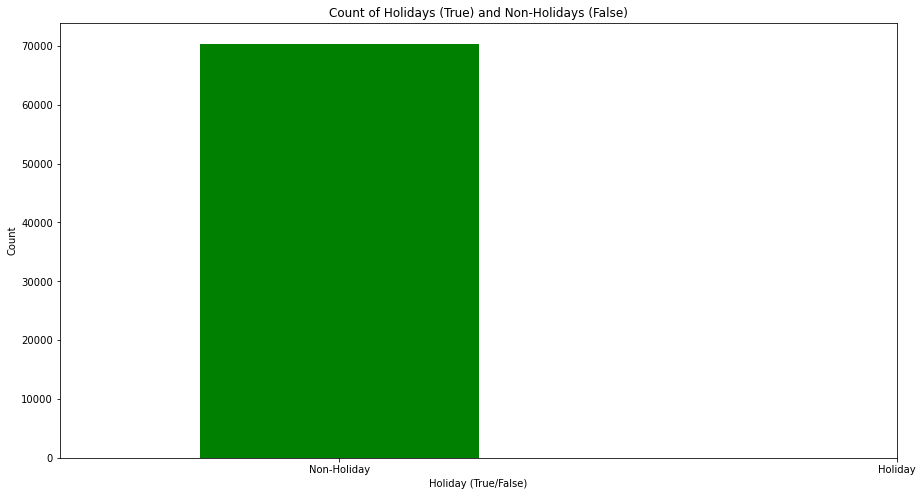

In [10]:
# Count the occurrences of True and False in the "IS_HOLIDAY" column
holiday_counts = data["IS_HOLIDAY"].value_counts()

# Plot the bar graph
holiday_counts.plot(kind='bar', color=['green', 'red'])
plt.xlabel('Holiday (True/False)')
plt.ylabel('Count')
plt.title('Count of Holidays (True) and Non-Holidays (False)')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'], rotation=0)
plt.show()

In [11]:
for obs in range(1,6):
    data["T_" + str(obs)] = data.USAGE.shift(obs)

#### Importance and Benefits lag features:

**Model Input:**
*Lag features become additional input variables for your model, providing historical context for each observation.*

**Time Series Forecasting:**
*For time series forecasting tasks, lag features can significantly improve the model's ability to predict future values based on past observations.*

**Model Interpretability:**
*Lag features contribute to the interpretability of the model by explicitly showing which past time steps the model considers when making predictions.*

**Seasonality and Trends:**
*Lag features are useful for capturing seasonality and trend components in time series data. They provide the model with information about how the variable has changed over time.*

train ['USAGE'].shift(i) shifts the values of the 'USAGE' column upward by i positions. This means that the 'lag_1' feature contains the value of 'USAGE' from the previous time step, 'lag_2' contains the value from two time steps ago, and so on.

**Considerations:**
1]Lag Order
2]Handling Missing Values

In [12]:
data.fillna(0.00,inplace=True)
data.head(10)

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
0,Electric usage,2016-10-22,00:00:00,00:14:00,0.01,kWh,0.0,0.0,2016-10-22 00:14:00,0,False,0.00,0.00,0.00,0.00,0.00
1,Electric usage,2016-10-22,00:15:00,00:29:00,0.01,kWh,0.0,0.0,2016-10-22 00:29:00,0,False,0.01,0.00,0.00,0.00,0.00
2,Electric usage,2016-10-22,00:30:00,00:44:00,0.01,kWh,0.0,0.0,2016-10-22 00:44:00,0,False,0.01,0.01,0.00,0.00,0.00
3,Electric usage,2016-10-22,00:45:00,00:59:00,0.01,kWh,0.0,0.0,2016-10-22 00:59:00,0,False,0.01,0.01,0.01,0.00,0.00
4,Electric usage,2016-10-22,01:00:00,01:14:00,0.01,kWh,0.0,0.0,2016-10-22 01:14:00,0,False,0.01,0.01,0.01,0.01,0.00
5,Electric usage,2016-10-22,01:15:00,01:29:00,0.01,kWh,0.0,0.0,2016-10-22 01:29:00,0,False,0.01,0.01,0.01,0.01,0.01
6,Electric usage,2016-10-22,01:30:00,01:44:00,0.01,kWh,0.0,0.0,2016-10-22 01:44:00,0,False,0.01,0.01,0.01,0.01,0.01
7,Electric usage,2016-10-22,01:45:00,01:59:00,0.01,kWh,0.0,0.0,2016-10-22 01:59:00,0,False,0.01,0.01,0.01,0.01,0.01
8,Electric usage,2016-10-22,02:00:00,02:14:00,0.02,kWh,0.0,0.0,2016-10-22 02:14:00,0,False,0.01,0.01,0.01,0.01,0.01
9,Electric usage,2016-10-22,02:15:00,02:29:00,0.02,kWh,0.0,0.0,2016-10-22 02:29:00,0,False,0.02,0.01,0.01,0.01,0.01


In [13]:
data.IS_HOLIDAY = data.IS_HOLIDAY.astype("int")

In [14]:
data

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
0,Electric usage,2016-10-22,00:00:00,00:14:00,0.01,kWh,0.00,0.0,2016-10-22 00:14:00,0,0,0.00,0.00,0.00,0.00,0.00
1,Electric usage,2016-10-22,00:15:00,00:29:00,0.01,kWh,0.00,0.0,2016-10-22 00:29:00,0,0,0.01,0.00,0.00,0.00,0.00
2,Electric usage,2016-10-22,00:30:00,00:44:00,0.01,kWh,0.00,0.0,2016-10-22 00:44:00,0,0,0.01,0.01,0.00,0.00,0.00
3,Electric usage,2016-10-22,00:45:00,00:59:00,0.01,kWh,0.00,0.0,2016-10-22 00:59:00,0,0,0.01,0.01,0.01,0.00,0.00
4,Electric usage,2016-10-22,01:00:00,01:14:00,0.01,kWh,0.00,0.0,2016-10-22 01:14:00,0,0,0.01,0.01,0.01,0.01,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70363,Electric usage,2018-10-24,22:45:00,22:59:00,0.02,kWh,0.00,0.0,2018-10-24 22:59:00,0,0,0.02,0.02,0.02,0.03,0.03
70364,Electric usage,2018-10-24,23:00:00,23:14:00,0.03,kWh,0.01,0.0,2018-10-24 23:14:00,0,0,0.02,0.02,0.02,0.02,0.03
70365,Electric usage,2018-10-24,23:15:00,23:29:00,0.03,kWh,0.01,0.0,2018-10-24 23:29:00,0,0,0.03,0.02,0.02,0.02,0.02
70366,Electric usage,2018-10-24,23:30:00,23:44:00,0.03,kWh,0.01,0.0,2018-10-24 23:44:00,0,0,0.03,0.03,0.02,0.02,0.02


In [15]:
clean_data = data[['DAY_TYPE', 'IS_HOLIDAY', 'T_1','T_2', 'T_3', 'T_4', 'T_5','USAGE']]
clean_data.tail(5)

,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5,USAGE
70363,0,0,0.02,0.02,0.02,0.03,0.03,0.02
70364,0,0,0.02,0.02,0.02,0.02,0.03,0.03
70365,0,0,0.03,0.02,0.02,0.02,0.02,0.03
70366,0,0,0.03,0.03,0.02,0.02,0.02,0.03
70367,0,0,0.03,0.03,0.03,0.02,0.02,0.03


In [16]:
data_tmp_dict = dict(Usage=data['USAGE'], Date=data['DateTime'])
data_tmp_dict

{'Usage': 0        0.01
 1        0.01
 2        0.01
 3        0.01
 4        0.01
          ... 
 70363    0.02
 70364    0.03
 70365    0.03
 70366    0.03
 70367    0.03
 Name: USAGE, Length: 70368, dtype: float64,
 'Date': 0       2016-10-22 00:14:00
 1       2016-10-22 00:29:00
 2       2016-10-22 00:44:00
 3       2016-10-22 00:59:00
 4       2016-10-22 01:14:00
                 ...        
 70363   2018-10-24 22:59:00
 70364   2018-10-24 23:14:00
 70365   2018-10-24 23:29:00
 70366   2018-10-24 23:44:00
 70367   2018-10-24 23:59:00
 Name: DateTime, Length: 70368, dtype: datetime64[ns]}

In [18]:
pip install --upgrade bokeh


Defaulting to user installation because normal site-packages is not writeable
  Using cached bokeh-3.3.3-py3-none-any.whl (6.8 MB)
  Attempting uninstall: bokeh
    Found existing installation: bokeh 0.12.15
    Uninstalling bokeh-0.12.15:
      Successfully uninstalled bokeh-0.12.15
Note: you may need to restart the kernel to use updated packages.


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
panel 0.13.0 requires bokeh<2.5.0,>=2.4.0, but you have bokeh 3.3.3 which is incompatible.


In [19]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

# Assuming you have a pandas DataFrame named 'df' with columns 'x' and 'y'
output_notebook()

Loading BokehJS ...

In [20]:
import bokeh as bk
bk.__version__

'3.3.3'

In [21]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
from bokeh.palettes import Spectral11
from bokeh.io import output_notebook

In [22]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
from bokeh.io import output_notebook

# Assuming you have a DataFrame named 'data_tmp_dict' with columns 'Date' and 'Usage'
output_notebook()

# Convert 'Date' to datetime format if not already
data_tmp_dict['Date'] = pd.to_datetime(data_tmp_dict['Date'])

# Create a ColumnDataSource from the DataFrame
source = ColumnDataSource(data_tmp_dict)

# Create a figure
p = figure(x_axis_label='Date', y_axis_label='Usage in kWh', title="Usage", width=800, height=400)

# Plot the time series
p.line(x='Date', y='Usage', line_width=2, source=source)

# Show the plot
show(p)


Loading BokehJS ...

In [23]:
xmask = (data.DateTime >= pd.to_datetime("12/20/2016")) & (data.DateTime <= pd.to_datetime("12/27/2016"))

In [24]:
xmask

0        False
1        False
2        False
3        False
4        False
         ...  
70363    False
70364    False
70365    False
70366    False
70367    False
Name: DateTime, Length: 70368, dtype: bool

In [25]:
xmas_week = data.loc[xmask]
xmas_week

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
5668,Electric usage,2016-12-20,00:00:00,00:14:00,1.11,kWh,0.20,0.0,2016-12-20 00:14:00,0,0,0.48,0.48,0.48,0.48,0.41
5669,Electric usage,2016-12-20,00:15:00,00:29:00,1.11,kWh,0.20,0.0,2016-12-20 00:29:00,0,0,1.11,0.48,0.48,0.48,0.48
5670,Electric usage,2016-12-20,00:30:00,00:44:00,1.11,kWh,0.20,0.0,2016-12-20 00:44:00,0,0,1.11,1.11,0.48,0.48,0.48
5671,Electric usage,2016-12-20,00:45:00,00:59:00,1.11,kWh,0.20,0.0,2016-12-20 00:59:00,0,0,1.11,1.11,1.11,0.48,0.48
5672,Electric usage,2016-12-20,01:00:00,01:14:00,0.79,kWh,0.15,0.0,2016-12-20 01:14:00,0,0,1.11,1.11,1.11,1.11,0.48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6335,Electric usage,2016-12-26,22:45:00,22:59:00,0.08,kWh,0.02,0.0,2016-12-26 22:59:00,0,0,0.08,0.08,0.08,0.29,0.29
6336,Electric usage,2016-12-26,23:00:00,23:14:00,0.07,kWh,0.01,0.0,2016-12-26 23:14:00,0,0,0.08,0.08,0.08,0.08,0.29
6337,Electric usage,2016-12-26,23:15:00,23:29:00,0.07,kWh,0.01,0.0,2016-12-26 23:29:00,0,0,0.07,0.08,0.08,0.08,0.08
6338,Electric usage,2016-12-26,23:30:00,23:44:00,0.07,kWh,0.01,0.0,2016-12-26 23:44:00,0,0,0.07,0.07,0.08,0.08,0.08


In [26]:
xmas_dict = dict(Usage=xmas_week['USAGE'],Date=xmas_week['DateTime'])
xmas_dict

{'Usage': 5668    1.11
 5669    1.11
 5670    1.11
 5671    1.11
 5672    0.79
         ... 
 6335    0.08
 6336    0.07
 6337    0.07
 6338    0.07
 6339    0.07
 Name: USAGE, Length: 672, dtype: float64,
 'Date': 5668   2016-12-20 00:14:00
 5669   2016-12-20 00:29:00
 5670   2016-12-20 00:44:00
 5671   2016-12-20 00:59:00
 5672   2016-12-20 01:14:00
                ...        
 6335   2016-12-26 22:59:00
 6336   2016-12-26 23:14:00
 6337   2016-12-26 23:29:00
 6338   2016-12-26 23:44:00
 6339   2016-12-26 23:59:00
 Name: DateTime, Length: 672, dtype: datetime64[ns]}

In [27]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, DatetimeTickFormatter
from bokeh.io import output_notebook
output_notebook()

xmas_dict['Date'] = pd.to_datetime(xmas_dict['Date'])
source = ColumnDataSource(xmas_dict)
p = figure(x_axis_label='Date', y_axis_label='Usage in kWh', title="Usage Xmas Day", width=800, height=400)
p.line(x='Date', y='Usage', line_width=2, source=source)
p.xaxis.major_label_orientation = 45
p.xaxis.formatter = DatetimeTickFormatter(days=["%Y-%m-%d"])
show(p)


Loading BokehJS ...

In [28]:
dmask = (data.DateTime >= pd.to_datetime("01/01/2017")) & (data.DateTime < pd.to_datetime("01/02/2017"))
nyd = data.loc[dmask]
nyd

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
6820,Electric usage,2017-01-01,00:00:00,00:14:00,0.37,kWh,0.07,0.0,2017-01-01 00:14:00,1,0,0.38,0.38,0.38,0.38,0.36
6821,Electric usage,2017-01-01,00:15:00,00:29:00,0.37,kWh,0.07,0.0,2017-01-01 00:29:00,1,0,0.37,0.38,0.38,0.38,0.38
6822,Electric usage,2017-01-01,00:30:00,00:44:00,0.37,kWh,0.07,0.0,2017-01-01 00:44:00,1,0,0.37,0.37,0.38,0.38,0.38
6823,Electric usage,2017-01-01,00:45:00,00:59:00,0.37,kWh,0.07,0.0,2017-01-01 00:59:00,1,0,0.37,0.37,0.37,0.38,0.38
6824,Electric usage,2017-01-01,01:00:00,01:14:00,0.35,kWh,0.06,0.0,2017-01-01 01:14:00,1,0,0.37,0.37,0.37,0.37,0.38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6911,Electric usage,2017-01-01,22:45:00,22:59:00,0.10,kWh,0.02,0.0,2017-01-01 22:59:00,1,0,0.10,0.10,0.10,0.06,0.06
6912,Electric usage,2017-01-01,23:00:00,23:14:00,0.35,kWh,0.06,0.0,2017-01-01 23:14:00,1,0,0.10,0.10,0.10,0.10,0.06
6913,Electric usage,2017-01-01,23:15:00,23:29:00,0.35,kWh,0.06,0.0,2017-01-01 23:29:00,1,0,0.35,0.10,0.10,0.10,0.10
6914,Electric usage,2017-01-01,23:30:00,23:44:00,0.35,kWh,0.06,0.0,2017-01-01 23:44:00,1,0,0.35,0.35,0.10,0.10,0.10


In [29]:
nyd_dict = dict(Usage=nyd['USAGE'],Date=nyd['DateTime'])
nyd_dict

{'Usage': 6820    0.37
 6821    0.37
 6822    0.37
 6823    0.37
 6824    0.35
         ... 
 6911    0.10
 6912    0.35
 6913    0.35
 6914    0.35
 6915    0.35
 Name: USAGE, Length: 96, dtype: float64,
 'Date': 6820   2017-01-01 00:14:00
 6821   2017-01-01 00:29:00
 6822   2017-01-01 00:44:00
 6823   2017-01-01 00:59:00
 6824   2017-01-01 01:14:00
                ...        
 6911   2017-01-01 22:59:00
 6912   2017-01-01 23:14:00
 6913   2017-01-01 23:29:00
 6914   2017-01-01 23:44:00
 6915   2017-01-01 23:59:00
 Name: DateTime, Length: 96, dtype: datetime64[ns]}

In [30]:
nyd_dict['Date'] = pd.to_datetime(nyd_dict['Date'])
# Create a ColumnDataSource from the DataFrame
source = ColumnDataSource(nyd_dict)
p = figure(x_axis_label='Date', y_axis_label='Usage in kWh', title="Usage New Year's Day", width=800, height=400)
p.line(x='Date', y='Usage', line_width=2, source=source)
p.xaxis.major_label_orientation = 45
p.xaxis.formatter = DatetimeTickFormatter(days=["%Y-%m-%d"])
show(p)


In [31]:
training_data = data[data.DateTime < pd.to_datetime("08/08/2017")]
training_data

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
0,Electric usage,2016-10-22,00:00:00,00:14:00,0.01,kWh,0.00,0.0,2016-10-22 00:14:00,0,0,0.00,0.00,0.00,0.00,0.00
1,Electric usage,2016-10-22,00:15:00,00:29:00,0.01,kWh,0.00,0.0,2016-10-22 00:29:00,0,0,0.01,0.00,0.00,0.00,0.00
2,Electric usage,2016-10-22,00:30:00,00:44:00,0.01,kWh,0.00,0.0,2016-10-22 00:44:00,0,0,0.01,0.01,0.00,0.00,0.00
3,Electric usage,2016-10-22,00:45:00,00:59:00,0.01,kWh,0.00,0.0,2016-10-22 00:59:00,0,0,0.01,0.01,0.01,0.00,0.00
4,Electric usage,2016-10-22,01:00:00,01:14:00,0.01,kWh,0.00,0.0,2016-10-22 01:14:00,0,0,0.01,0.01,0.01,0.01,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27835,Electric usage,2017-08-07,22:45:00,22:59:00,0.07,kWh,0.01,0.0,2017-08-07 22:59:00,0,0,0.07,0.07,0.07,0.14,0.14
27836,Electric usage,2017-08-07,23:00:00,23:14:00,0.02,kWh,0.00,0.0,2017-08-07 23:14:00,0,0,0.07,0.07,0.07,0.07,0.14
27837,Electric usage,2017-08-07,23:15:00,23:29:00,0.02,kWh,0.00,0.0,2017-08-07 23:29:00,0,0,0.02,0.07,0.07,0.07,0.07
27838,Electric usage,2017-08-07,23:30:00,23:44:00,0.02,kWh,0.00,0.0,2017-08-07 23:44:00,0,0,0.02,0.02,0.07,0.07,0.07


In [32]:
val_mask = (data.DateTime >= pd.to_datetime("08/08/2017")) & (data.DateTime < pd.to_datetime("01/01/2018"))
val_data = data.loc[val_mask]
val_data

,TYPE,Date,START TIME,END TIME,USAGE,UNITS,COST,NOTES,DateTime,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
27840,Electric usage,2017-08-08,00:00:00,00:14:00,0.05,kWh,0.01,0.0,2017-08-08 00:14:00,0,0,0.02,0.02,0.02,0.02,0.07
27841,Electric usage,2017-08-08,00:15:00,00:29:00,0.05,kWh,0.01,0.0,2017-08-08 00:29:00,0,0,0.05,0.02,0.02,0.02,0.02
27842,Electric usage,2017-08-08,00:30:00,00:44:00,0.05,kWh,0.01,0.0,2017-08-08 00:44:00,0,0,0.05,0.05,0.02,0.02,0.02
27843,Electric usage,2017-08-08,00:45:00,00:59:00,0.05,kWh,0.01,0.0,2017-08-08 00:59:00,0,0,0.05,0.05,0.05,0.02,0.02
27844,Electric usage,2017-08-08,01:00:00,01:14:00,0.02,kWh,0.00,0.0,2017-08-08 01:14:00,0,0,0.05,0.05,0.05,0.05,0.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41855,Electric usage,2017-12-31,22:45:00,22:59:00,0.10,kWh,0.03,0.0,2017-12-31 22:59:00,1,0,0.10,0.10,0.10,0.11,0.11
41856,Electric usage,2017-12-31,23:00:00,23:14:00,0.07,kWh,0.02,0.0,2017-12-31 23:14:00,1,0,0.10,0.10,0.10,0.10,0.11
41857,Electric usage,2017-12-31,23:15:00,23:29:00,0.07,kWh,0.02,0.0,2017-12-31 23:29:00,1,0,0.07,0.10,0.10,0.10,0.10
41858,Electric usage,2017-12-31,23:30:00,23:44:00,0.07,kWh,0.02,0.0,2017-12-31 23:44:00,1,0,0.07,0.07,0.10,0.10,0.10


In [33]:
test_data = data[data.DateTime >= pd.to_datetime("1/01/2018")]
test_data.dtypes

TYPE                  object
Date          datetime64[ns]
START TIME            object
END TIME              object
USAGE                float64
UNITS                 object
COST                 float64
NOTES                float64
DateTime      datetime64[ns]
DAY_TYPE               int64
IS_HOLIDAY             int32
T_1                  float64
T_2                  float64
T_3                  float64
T_4                  float64
T_5                  float64
dtype: object

In [34]:
clean_train = training_data[['DAY_TYPE', 'IS_HOLIDAY', 'T_1','T_2', 'T_3', 'T_4', 'T_5','USAGE',]]
clean_test = test_data[['DAY_TYPE', 'IS_HOLIDAY', 'T_1','T_2', 'T_3', 'T_4', 'T_5','USAGE',]]
clean_val = val_data[['DAY_TYPE', 'IS_HOLIDAY', 'T_1','T_2', 'T_3', 'T_4', 'T_5','USAGE',]]

In [35]:
clean_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27840 entries, 0 to 27839
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DAY_TYPE    27840 non-null  int64  
 1   IS_HOLIDAY  27840 non-null  int32  
 2   T_1         27840 non-null  float64
 3   T_2         27840 non-null  float64
 4   T_3         27840 non-null  float64
 5   T_4         27840 non-null  float64
 6   T_5         27840 non-null  float64
 7   USAGE       27840 non-null  float64
dtypes: float64(6), int32(1), int64(1)
memory usage: 1.8 MB


In [36]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error
X_train,y_train = clean_train.drop(["USAGE"],axis=1),clean_train.USAGE
X_test,y_test = clean_test.drop(["USAGE"],axis=1),clean_test.USAGE
X_val,y_val = clean_val.drop(["USAGE"],axis=1),clean_val.USAGE

In [37]:
X_train,y_train = clean_train.drop(["USAGE"],axis=1),clean_train.USAGE
X_test,y_test = clean_test.drop(["USAGE"],axis=1),clean_test.USAGE
X_val,y_val = clean_val.drop(["USAGE"],axis=1),clean_val.USAGE

In [38]:
scaler = StandardScaler()
#scaler = MinMaxScaler(feature_range=(-1, 1))
rfr  = RandomForestRegressor(random_state=2017,verbose=2,n_jobs=5)

In [39]:
X_train

,DAY_TYPE,IS_HOLIDAY,T_1,T_2,T_3,T_4,T_5
0,0,0,0.00,0.00,0.00,0.00,0.00
1,0,0,0.01,0.00,0.00,0.00,0.00
2,0,0,0.01,0.01,0.00,0.00,0.00
3,0,0,0.01,0.01,0.01,0.00,0.00
4,0,0,0.01,0.01,0.01,0.01,0.00
...,...,...,...,...,...,...,...
27835,0,0,0.07,0.07,0.07,0.14,0.14
27836,0,0,0.07,0.07,0.07,0.07,0.14
27837,0,0,0.02,0.07,0.07,0.07,0.07
27838,0,0,0.02,0.02,0.07,0.07,0.07


In [40]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
X_valid_scaled = scaler.fit_transform(X_val)

In [48]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

In [49]:
model_k = Sequential()
model_k.add(LSTM(1, input_shape=(1,7)))
model_k.add(Dense(1))
model_k.compile(loss='mean_squared_error', optimizer='adam')

In [50]:
X_t_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))

In [51]:
X_val_resaped = X_valid_scaled.reshape((X_valid_scaled.shape[0], 1, X_valid_scaled.shape[1]))


In [52]:
history = model_k.fit(X_t_reshaped, y_train, validation_data=(X_val_resaped, y_val),\
epochs=20,batch_size=96, verbose=2)

Epoch 1/20
290/290 - 7s - loss: 0.0641 - val_loss: 0.0534 - 7s/epoch - 24ms/step
Epoch 2/20
290/290 - 1s - loss: 0.0433 - val_loss: 0.0409 - 1s/epoch - 5ms/step
Epoch 3/20
290/290 - 1s - loss: 0.0280 - val_loss: 0.0214 - 1s/epoch - 5ms/step
Epoch 4/20
290/290 - 1s - loss: 0.0173 - val_loss: 0.0170 - 1s/epoch - 5ms/step
Epoch 5/20
290/290 - 1s - loss: 0.0154 - val_loss: 0.0162 - 1s/epoch - 5ms/step
Epoch 6/20
290/290 - 1s - loss: 0.0147 - val_loss: 0.0157 - 1s/epoch - 5ms/step
Epoch 7/20
290/290 - 1s - loss: 0.0143 - val_loss: 0.0153 - 1s/epoch - 5ms/step
Epoch 8/20
290/290 - 1s - loss: 0.0140 - val_loss: 0.0149 - 1s/epoch - 5ms/step
Epoch 9/20
290/290 - 1s - loss: 0.0137 - val_loss: 0.0147 - 1s/epoch - 5ms/step
Epoch 10/20
290/290 - 1s - loss: 0.0135 - val_loss: 0.0145 - 1s/epoch - 5ms/step
Epoch 11/20
290/290 - 1s - loss: 0.0133 - val_loss: 0.0143 - 1s/epoch - 5ms/step
Epoch 12/20
290/290 - 1s - loss: 0.0131 - val_loss: 0.0143 - 1s/epoch - 5ms/step
Epoch 13/20
290/290 - 2s - loss: 0.0

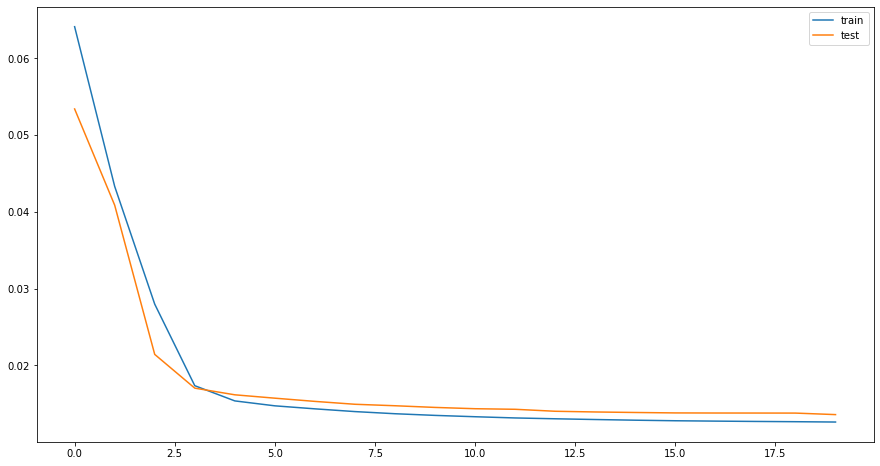

In [53]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

In [54]:
X_te_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

In [55]:
res = model_k.predict(X_te_reshaped)


891/891 [==============================] - 3s 3ms/step


In [56]:
test_data["DL_PRED"] = res

C:\Users\Darshan\AppData\Local\Temp\ipykernel_21864\1070672441.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data["DL_PRED"] = res


In [57]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource

test_data['DateTime'] = pd.to_datetime(test_data['DateTime'])
source = ColumnDataSource(test_data)
p = figure(x_axis_label='Date Time', y_axis_label='Usage', title="Usage vs Predictions", width=900, height=350)
p.line(x='DateTime', y='USAGE', line_width=2, source=source, legend_label='Actual Usage')
p.line(x='DateTime', y='RF_PREDICTED', line_width=2, source=source, line_color='orange', legend_label='RF Predicted')
p.line(x='DateTime', y='DL_PRED', line_width=2, source=source, line_color='green', legend_label='DL Predicted')
p.legend.location = "top_left"
show(p)


C:\Users\Darshan\AppData\Local\Temp\ipykernel_21864\3928058054.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['DateTime'] = pd.to_datetime(test_data['DateTime'])


In [58]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
sep_30m = test_data[test_data.DateTime >= pd.to_datetime("09/30/2017")]
sep_30m['DateTime'] = pd.to_datetime(sep_30m['DateTime'])
source = ColumnDataSource(sep_30m)
p = figure(x_axis_label='Date Time', y_axis_label='Usage', title="Usage vs Predictions", width=900, height=350)
p.line(x='DateTime', y='USAGE', line_width=2, source=source, legend_label='Actual Usage')
p.line(x='DateTime', y='RF_PREDICTED', line_width=2, source=source, line_color='orange', legend_label='RF Predicted')
p.line(x='DateTime', y='DL_PRED', line_width=2, source=source, line_color='green', legend_label='DL Predicted')
p.legend.location = "top_left"
show(p)


In [59]:
from numpy import sqrt
sqrt(mean_squared_error(test_data.USAGE,test_data.DL_PRED))

0.09513443575731603

In [60]:
sqrt(mean_squared_error(test_data.USAGE,test_data.RF_PREDICTED))

0.10348596939225176